In [1]:
from __future__ import print_function
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

manual_seed = random.randint(1, 10000)
print('Random Seed: ', manual_seed)
random.seed(manual_seed)
torch.manual_seed(manual_seed)

Random Seed:  2950


In [2]:
dataroot = 'data/'
workers = 2
batch_size = 128
image_size = 64
nc = 3
nz = 100
ngf = 64
ndf = 64
num_epochs = 1000
lr = 0.0002
beta1 = 0.5
ngpu = 1

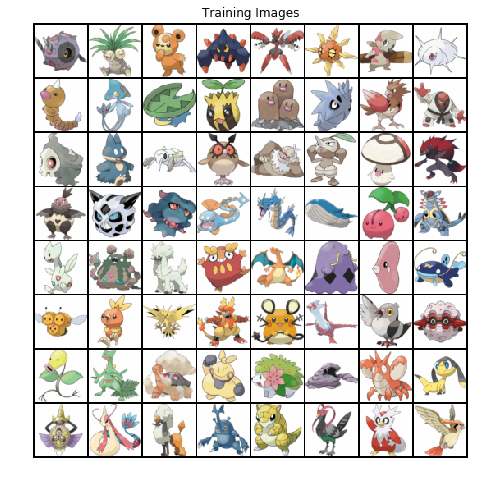

In [3]:
dataset = dset.ImageFolder(root=dataroot,
                          transform=transforms.Compose([
                              transforms.Resize(image_size),
                              transforms.CenterCrop(image_size),
                              transforms.ToTensor(),
                              transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                          ]))

dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                        shuffle=True, num_workers=workers)

device = torch.device('cuda:0' if (torch.cuda.is_available() and ngpu > 0) else 'cpu')

realbatch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis('off')
plt.title('Training Images')
plt.imshow(np.transpose(vutils.make_grid(realbatch[0].to(device)[:64], padding=2, normalize=True).cpu(), (1, 2, 0)))

In [4]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [5]:
class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
        )

    def forward(self, input):
        return self.main(input)

In [6]:
netG = Generator(ngpu).to(device)

if device.type == 'cuda' and ngpu > 1:
    netG = nn.DataParallel(netg, list(range(ngpu)))
    
netG.apply(weights_init)

print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


In [7]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

In [8]:
netD = Discriminator(ngpu).to(device)

if device.type == 'cuda' and ngpu > 1:
    netD = nn.DataParallel(netd, list(range(ngpu)))
    
netD.apply(weights_init)

print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


In [9]:
criterion = nn.BCELoss()

fixed_noise = torch.randn(64, nz, 1, 1, device=device)

real_label = 1
fake_label = 0

optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

In [10]:
# Training Loop

img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
for epoch in range(num_epochs):
    for i, data in enumerate(dataloader, 0):

        # Update Discriminator network: maximize log(D(x)) + log(1 - D(G(z)))
        netD.zero_grad()
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, device=device)
        output = netD(real_cpu).view(-1)
        errD_real = criterion(output, label)
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        fake = netG(noise)
        label.fill_(fake_label)
        output = netD(fake.detach()).view(-1)
        errD_fake = criterion(output, label)
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        errD = errD_real + errD_fake

        optimizerD.step()

        # Update Generator network: maximize log(D(G(z)))
        netG.zero_grad()
        label.fill_(real_label)
        output = netD(fake).view(-1)
        errG = criterion(output, label)
        errG.backward()
        D_G_z2 = output.mean().item()

        optimizerG.step()

        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        G_losses.append(errG.item())
        D_losses.append(errD.item())

        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

Starting Training Loop...
[0/1000][0/7]	Loss_D: 1.8921	Loss_G: 4.1767	D(x): 0.4356	D(G(z)): 0.5459 / 0.0216
[1/1000][0/7]	Loss_D: 0.3778	Loss_G: 8.6532	D(x): 0.9456	D(G(z)): 0.2187 / 0.0003
[2/1000][0/7]	Loss_D: 0.2067	Loss_G: 10.0800	D(x): 0.8517	D(G(z)): 0.0029 / 0.0001
[3/1000][0/7]	Loss_D: 0.1768	Loss_G: 14.8840	D(x): 0.9996	D(G(z)): 0.1525 / 0.0000
[4/1000][0/7]	Loss_D: 0.1182	Loss_G: 8.9828	D(x): 0.9621	D(G(z)): 0.0678 / 0.0002
[5/1000][0/7]	Loss_D: 4.6034	Loss_G: 19.5213	D(x): 0.9539	D(G(z)): 0.9817 / 0.0000
[6/1000][0/7]	Loss_D: 1.9977	Loss_G: 14.9422	D(x): 0.3074	D(G(z)): 0.0000 / 0.0000
[7/1000][0/7]	Loss_D: 0.1739	Loss_G: 6.3905	D(x): 0.8798	D(G(z)): 0.0071 / 0.0027
[8/1000][0/7]	Loss_D: 0.7723	Loss_G: 10.5757	D(x): 0.9762	D(G(z)): 0.4690 / 0.0000
[9/1000][0/7]	Loss_D: 2.5686	Loss_G: 14.0782	D(x): 0.9903	D(G(z)): 0.8872 / 0.0000
[10/1000][0/7]	Loss_D: 1.3487	Loss_G: 9.3425	D(x): 0.9128	D(G(z)): 0.6691 / 0.0002
[11/1000][0/7]	Loss_D: 1.1501	Loss_G: 2.1068	D(x): 0.4614	D(G(z))

[99/1000][0/7]	Loss_D: 0.6836	Loss_G: 5.8741	D(x): 0.9737	D(G(z)): 0.4504 / 0.0042
[100/1000][0/7]	Loss_D: 0.2435	Loss_G: 3.2349	D(x): 0.9586	D(G(z)): 0.1703 / 0.0555
[101/1000][0/7]	Loss_D: 0.4868	Loss_G: 5.2299	D(x): 0.9511	D(G(z)): 0.3342 / 0.0087
[102/1000][0/7]	Loss_D: 0.3916	Loss_G: 4.3230	D(x): 0.9381	D(G(z)): 0.2610 / 0.0194
[103/1000][0/7]	Loss_D: 0.8342	Loss_G: 0.8820	D(x): 0.4852	D(G(z)): 0.0330 / 0.4988
[104/1000][0/7]	Loss_D: 1.0930	Loss_G: 7.9699	D(x): 0.9795	D(G(z)): 0.6071 / 0.0013
[105/1000][0/7]	Loss_D: 0.4771	Loss_G: 4.4521	D(x): 0.8592	D(G(z)): 0.2548 / 0.0168
[106/1000][0/7]	Loss_D: 0.4195	Loss_G: 2.8126	D(x): 0.8137	D(G(z)): 0.1730 / 0.0817
[107/1000][0/7]	Loss_D: 0.3137	Loss_G: 2.9112	D(x): 0.9322	D(G(z)): 0.2012 / 0.0782
[108/1000][0/7]	Loss_D: 0.3511	Loss_G: 2.9884	D(x): 0.7821	D(G(z)): 0.0770 / 0.0750
[109/1000][0/7]	Loss_D: 1.1878	Loss_G: 8.4070	D(x): 0.9784	D(G(z)): 0.6389 / 0.0006
[110/1000][0/7]	Loss_D: 0.5335	Loss_G: 4.7315	D(x): 0.9223	D(G(z)): 0.3240 / 

[197/1000][0/7]	Loss_D: 0.3413	Loss_G: 1.5646	D(x): 0.7337	D(G(z)): 0.0153 / 0.2551
[198/1000][0/7]	Loss_D: 0.6319	Loss_G: 4.3123	D(x): 0.9296	D(G(z)): 0.3471 / 0.0318
[199/1000][0/7]	Loss_D: 0.2973	Loss_G: 4.5632	D(x): 0.8627	D(G(z)): 0.1124 / 0.0234
[200/1000][0/7]	Loss_D: 0.4394	Loss_G: 2.5369	D(x): 0.7501	D(G(z)): 0.1151 / 0.1064
[201/1000][0/7]	Loss_D: 0.2823	Loss_G: 3.4979	D(x): 0.8596	D(G(z)): 0.1047 / 0.0460
[202/1000][0/7]	Loss_D: 0.2141	Loss_G: 3.9403	D(x): 0.9298	D(G(z)): 0.1236 / 0.0278
[203/1000][0/7]	Loss_D: 0.2190	Loss_G: 3.3565	D(x): 0.8861	D(G(z)): 0.0849 / 0.0516
[204/1000][0/7]	Loss_D: 0.1757	Loss_G: 3.6131	D(x): 0.9345	D(G(z)): 0.0971 / 0.0372
[205/1000][0/7]	Loss_D: 0.1742	Loss_G: 3.5624	D(x): 0.9238	D(G(z)): 0.0863 / 0.0393
[206/1000][0/7]	Loss_D: 0.1836	Loss_G: 3.3209	D(x): 0.9077	D(G(z)): 0.0790 / 0.0483
[207/1000][0/7]	Loss_D: 0.1873	Loss_G: 3.6018	D(x): 0.9384	D(G(z)): 0.1117 / 0.0361
[208/1000][0/7]	Loss_D: 0.1583	Loss_G: 3.6480	D(x): 0.9507	D(G(z)): 0.0985 /

[295/1000][0/7]	Loss_D: 0.0775	Loss_G: 4.3096	D(x): 0.9746	D(G(z)): 0.0494 / 0.0188
[296/1000][0/7]	Loss_D: 0.1701	Loss_G: 5.7854	D(x): 0.9902	D(G(z)): 0.1420 / 0.0043
[297/1000][0/7]	Loss_D: 1.4351	Loss_G: 0.9511	D(x): 0.5323	D(G(z)): 0.2513 / 0.4921
[298/1000][0/7]	Loss_D: 1.1048	Loss_G: 7.5153	D(x): 0.9284	D(G(z)): 0.5490 / 0.0018
[299/1000][0/7]	Loss_D: 0.4734	Loss_G: 5.0042	D(x): 0.8948	D(G(z)): 0.2634 / 0.0113
[300/1000][0/7]	Loss_D: 0.2366	Loss_G: 3.9209	D(x): 0.8791	D(G(z)): 0.0907 / 0.0326
[301/1000][0/7]	Loss_D: 0.1780	Loss_G: 4.2171	D(x): 0.9201	D(G(z)): 0.0836 / 0.0227
[302/1000][0/7]	Loss_D: 0.1635	Loss_G: 4.1366	D(x): 0.9424	D(G(z)): 0.0926 / 0.0242
[303/1000][0/7]	Loss_D: 0.1630	Loss_G: 3.8101	D(x): 0.9258	D(G(z)): 0.0769 / 0.0326
[304/1000][0/7]	Loss_D: 0.1438	Loss_G: 3.8952	D(x): 0.9297	D(G(z)): 0.0636 / 0.0315
[305/1000][0/7]	Loss_D: 0.1424	Loss_G: 4.0251	D(x): 0.9589	D(G(z)): 0.0912 / 0.0244
[306/1000][0/7]	Loss_D: 0.1294	Loss_G: 4.2356	D(x): 0.9609	D(G(z)): 0.0825 /

[393/1000][0/7]	Loss_D: 0.0466	Loss_G: 4.4215	D(x): 0.9823	D(G(z)): 0.0279 / 0.0166
[394/1000][0/7]	Loss_D: 0.0382	Loss_G: 4.3146	D(x): 0.9792	D(G(z)): 0.0169 / 0.0177
[395/1000][0/7]	Loss_D: 0.0376	Loss_G: 4.6436	D(x): 0.9882	D(G(z)): 0.0251 / 0.0126
[396/1000][0/7]	Loss_D: 0.0488	Loss_G: 4.7277	D(x): 0.9887	D(G(z)): 0.0360 / 0.0114
[397/1000][0/7]	Loss_D: 0.0377	Loss_G: 4.2190	D(x): 0.9823	D(G(z)): 0.0196 / 0.0185
[398/1000][0/7]	Loss_D: 0.0481	Loss_G: 4.7964	D(x): 0.9905	D(G(z)): 0.0373 / 0.0110
[399/1000][0/7]	Loss_D: 0.0503	Loss_G: 3.7272	D(x): 0.9629	D(G(z)): 0.0122 / 0.0327
[400/1000][0/7]	Loss_D: 0.0465	Loss_G: 4.5837	D(x): 0.9855	D(G(z)): 0.0309 / 0.0142
[401/1000][0/7]	Loss_D: 0.0490	Loss_G: 5.0226	D(x): 0.9856	D(G(z)): 0.0333 / 0.0086
[402/1000][0/7]	Loss_D: 0.0496	Loss_G: 3.8119	D(x): 0.9596	D(G(z)): 0.0082 / 0.0292
[403/1000][0/7]	Loss_D: 0.0412	Loss_G: 4.4889	D(x): 0.9836	D(G(z)): 0.0241 / 0.0151
[404/1000][0/7]	Loss_D: 0.0369	Loss_G: 4.4002	D(x): 0.9794	D(G(z)): 0.0158 /

[491/1000][0/7]	Loss_D: 0.0317	Loss_G: 4.8901	D(x): 0.9903	D(G(z)): 0.0215 / 0.0097
[492/1000][0/7]	Loss_D: 0.0329	Loss_G: 5.4525	D(x): 0.9926	D(G(z)): 0.0249 / 0.0063
[493/1000][0/7]	Loss_D: 0.0273	Loss_G: 5.1103	D(x): 0.9908	D(G(z)): 0.0178 / 0.0083
[494/1000][0/7]	Loss_D: 0.0262	Loss_G: 4.9845	D(x): 0.9910	D(G(z)): 0.0169 / 0.0091
[495/1000][0/7]	Loss_D: 0.0283	Loss_G: 4.8093	D(x): 0.9885	D(G(z)): 0.0165 / 0.0115
[496/1000][0/7]	Loss_D: 0.0315	Loss_G: 4.8430	D(x): 0.9879	D(G(z)): 0.0189 / 0.0110
[497/1000][0/7]	Loss_D: 0.0282	Loss_G: 4.8874	D(x): 0.9879	D(G(z)): 0.0158 / 0.0104
[498/1000][0/7]	Loss_D: 0.0291	Loss_G: 4.9990	D(x): 0.9906	D(G(z)): 0.0193 / 0.0091
[499/1000][0/7]	Loss_D: 0.0418	Loss_G: 5.2609	D(x): 0.9941	D(G(z)): 0.0347 / 0.0070
[500/1000][0/7]	Loss_D: 0.0264	Loss_G: 4.6717	D(x): 0.9851	D(G(z)): 0.0113 / 0.0126
[501/1000][0/7]	Loss_D: 0.0291	Loss_G: 4.9270	D(x): 0.9871	D(G(z)): 0.0158 / 0.0103
[502/1000][0/7]	Loss_D: 0.0250	Loss_G: 5.1302	D(x): 0.9919	D(G(z)): 0.0166 /

[589/1000][0/7]	Loss_D: 0.0145	Loss_G: 5.4069	D(x): 0.9945	D(G(z)): 0.0089 / 0.0065
[590/1000][0/7]	Loss_D: 0.0106	Loss_G: 5.7615	D(x): 0.9958	D(G(z)): 0.0064 / 0.0043
[591/1000][0/7]	Loss_D: 0.0132	Loss_G: 5.5686	D(x): 0.9944	D(G(z)): 0.0076 / 0.0055
[592/1000][0/7]	Loss_D: 0.0145	Loss_G: 5.3598	D(x): 0.9899	D(G(z)): 0.0043 / 0.0073
[593/1000][0/7]	Loss_D: 0.0159	Loss_G: 5.1765	D(x): 0.9910	D(G(z)): 0.0067 / 0.0081
[594/1000][0/7]	Loss_D: 0.0156	Loss_G: 5.2060	D(x): 0.9886	D(G(z)): 0.0041 / 0.0072
[595/1000][0/7]	Loss_D: 0.0151	Loss_G: 5.8291	D(x): 0.9953	D(G(z)): 0.0103 / 0.0045
[596/1000][0/7]	Loss_D: 0.0125	Loss_G: 5.4626	D(x): 0.9930	D(G(z)): 0.0055 / 0.0056
[597/1000][0/7]	Loss_D: 0.0138	Loss_G: 5.7527	D(x): 0.9970	D(G(z)): 0.0107 / 0.0047
[598/1000][0/7]	Loss_D: 0.0221	Loss_G: 6.6493	D(x): 0.9972	D(G(z)): 0.0188 / 0.0017
[599/1000][0/7]	Loss_D: 26.2903	Loss_G: 0.0000	D(x): 0.9873	D(G(z)): 1.0000 / 1.0000
[600/1000][0/7]	Loss_D: 9.9474	Loss_G: 9.4762	D(x): 0.4867	D(G(z)): 0.5769 

[687/1000][0/7]	Loss_D: 0.0435	Loss_G: 5.3130	D(x): 0.9838	D(G(z)): 0.0264 / 0.0079
[688/1000][0/7]	Loss_D: 0.0460	Loss_G: 5.0422	D(x): 0.9773	D(G(z)): 0.0222 / 0.0106
[689/1000][0/7]	Loss_D: 0.0392	Loss_G: 4.9863	D(x): 0.9792	D(G(z)): 0.0176 / 0.0115
[690/1000][0/7]	Loss_D: 0.0367	Loss_G: 5.2684	D(x): 0.9845	D(G(z)): 0.0205 / 0.0100
[691/1000][0/7]	Loss_D: 0.0358	Loss_G: 4.8432	D(x): 0.9799	D(G(z)): 0.0151 / 0.0126
[692/1000][0/7]	Loss_D: 0.0404	Loss_G: 5.4791	D(x): 0.9915	D(G(z)): 0.0307 / 0.0066
[693/1000][0/7]	Loss_D: 0.0732	Loss_G: 6.4889	D(x): 0.9947	D(G(z)): 0.0618 / 0.0024
[694/1000][0/7]	Loss_D: 0.0347	Loss_G: 5.1405	D(x): 0.9844	D(G(z)): 0.0183 / 0.0095
[695/1000][0/7]	Loss_D: 0.0329	Loss_G: 4.9761	D(x): 0.9867	D(G(z)): 0.0191 / 0.0110
[696/1000][0/7]	Loss_D: 0.0323	Loss_G: 4.9301	D(x): 0.9856	D(G(z)): 0.0173 / 0.0110
[697/1000][0/7]	Loss_D: 0.0322	Loss_G: 5.0238	D(x): 0.9823	D(G(z)): 0.0141 / 0.0112
[698/1000][0/7]	Loss_D: 0.0315	Loss_G: 5.1695	D(x): 0.9880	D(G(z)): 0.0190 /

[785/1000][0/7]	Loss_D: 0.0145	Loss_G: 6.1706	D(x): 0.9960	D(G(z)): 0.0104 / 0.0034
[786/1000][0/7]	Loss_D: 0.0151	Loss_G: 5.7594	D(x): 0.9970	D(G(z)): 0.0119 / 0.0047
[787/1000][0/7]	Loss_D: 0.0186	Loss_G: 6.3050	D(x): 0.9969	D(G(z)): 0.0153 / 0.0028
[788/1000][0/7]	Loss_D: 0.0118	Loss_G: 5.8707	D(x): 0.9959	D(G(z)): 0.0077 / 0.0045
[789/1000][0/7]	Loss_D: 0.0115	Loss_G: 5.6796	D(x): 0.9933	D(G(z)): 0.0047 / 0.0050
[790/1000][0/7]	Loss_D: 0.0107	Loss_G: 5.7284	D(x): 0.9951	D(G(z)): 0.0057 / 0.0049
[791/1000][0/7]	Loss_D: 0.0123	Loss_G: 5.7004	D(x): 0.9933	D(G(z)): 0.0056 / 0.0053
[792/1000][0/7]	Loss_D: 0.0127	Loss_G: 5.6769	D(x): 0.9922	D(G(z)): 0.0048 / 0.0055
[793/1000][0/7]	Loss_D: 0.0117	Loss_G: 5.8948	D(x): 0.9957	D(G(z)): 0.0074 / 0.0038
[794/1000][0/7]	Loss_D: 0.0154	Loss_G: 5.4021	D(x): 0.9950	D(G(z)): 0.0103 / 0.0064
[795/1000][0/7]	Loss_D: 0.0131	Loss_G: 6.1727	D(x): 0.9977	D(G(z)): 0.0107 / 0.0030
[796/1000][0/7]	Loss_D: 0.0218	Loss_G: 6.4934	D(x): 0.9977	D(G(z)): 0.0190 /

[883/1000][0/7]	Loss_D: 0.0075	Loss_G: 6.4446	D(x): 0.9971	D(G(z)): 0.0046 / 0.0024
[884/1000][0/7]	Loss_D: 0.0065	Loss_G: 6.2218	D(x): 0.9962	D(G(z)): 0.0027 / 0.0034
[885/1000][0/7]	Loss_D: 0.0068	Loss_G: 6.3950	D(x): 0.9973	D(G(z)): 0.0041 / 0.0025
[886/1000][0/7]	Loss_D: 0.0065	Loss_G: 6.4316	D(x): 0.9974	D(G(z)): 0.0039 / 0.0025
[887/1000][0/7]	Loss_D: 0.0084	Loss_G: 6.3678	D(x): 0.9980	D(G(z)): 0.0064 / 0.0025
[888/1000][0/7]	Loss_D: 0.0135	Loss_G: 7.1055	D(x): 0.9991	D(G(z)): 0.0124 / 0.0011
[889/1000][0/7]	Loss_D: 0.0085	Loss_G: 6.2810	D(x): 0.9965	D(G(z)): 0.0050 / 0.0029
[890/1000][0/7]	Loss_D: 0.0062	Loss_G: 6.3482	D(x): 0.9973	D(G(z)): 0.0035 / 0.0027
[891/1000][0/7]	Loss_D: 0.0065	Loss_G: 6.2859	D(x): 0.9979	D(G(z)): 0.0044 / 0.0027
[892/1000][0/7]	Loss_D: 0.0063	Loss_G: 6.1684	D(x): 0.9970	D(G(z)): 0.0032 / 0.0030
[893/1000][0/7]	Loss_D: 0.0067	Loss_G: 6.3818	D(x): 0.9974	D(G(z)): 0.0040 / 0.0026
[894/1000][0/7]	Loss_D: 0.0100	Loss_G: 6.9709	D(x): 0.9986	D(G(z)): 0.0084 /

[981/1000][0/7]	Loss_D: 0.0038	Loss_G: 6.8756	D(x): 0.9983	D(G(z)): 0.0021 / 0.0017
[982/1000][0/7]	Loss_D: 0.0043	Loss_G: 6.7326	D(x): 0.9988	D(G(z)): 0.0031 / 0.0018
[983/1000][0/7]	Loss_D: 0.0051	Loss_G: 6.8609	D(x): 0.9966	D(G(z)): 0.0018 / 0.0018
[984/1000][0/7]	Loss_D: 0.0053	Loss_G: 7.0569	D(x): 0.9987	D(G(z)): 0.0040 / 0.0013
[985/1000][0/7]	Loss_D: 0.0039	Loss_G: 6.7754	D(x): 0.9974	D(G(z)): 0.0013 / 0.0019
[986/1000][0/7]	Loss_D: 0.0041	Loss_G: 6.9511	D(x): 0.9985	D(G(z)): 0.0026 / 0.0016
[987/1000][0/7]	Loss_D: 0.0047	Loss_G: 6.6434	D(x): 0.9969	D(G(z)): 0.0015 / 0.0024
[988/1000][0/7]	Loss_D: 0.0040	Loss_G: 6.7359	D(x): 0.9982	D(G(z)): 0.0022 / 0.0019
[989/1000][0/7]	Loss_D: 0.0046	Loss_G: 6.9841	D(x): 0.9991	D(G(z)): 0.0037 / 0.0015
[990/1000][0/7]	Loss_D: 0.0041	Loss_G: 6.9386	D(x): 0.9982	D(G(z)): 0.0023 / 0.0015
[991/1000][0/7]	Loss_D: 0.0042	Loss_G: 7.1706	D(x): 0.9987	D(G(z)): 0.0029 / 0.0013
[992/1000][0/7]	Loss_D: 0.0042	Loss_G: 7.0846	D(x): 0.9979	D(G(z)): 0.0021 /

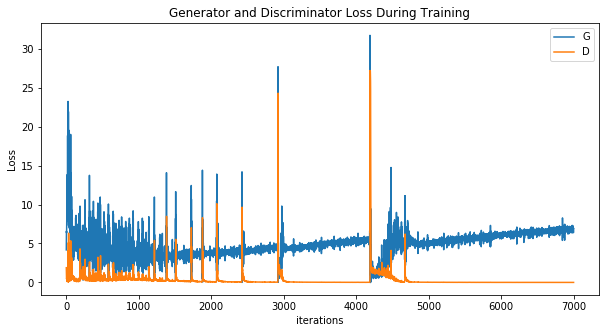

In [14]:
plt.figure(figsize=(10,5))
plt.title('Generator and Discriminator Loss During Training')
plt.plot(G_losses, label='G')
plt.plot(D_losses, label='D')
plt.xlabel('iterations')
plt.ylabel('Loss')
plt.legend()
plt.show()

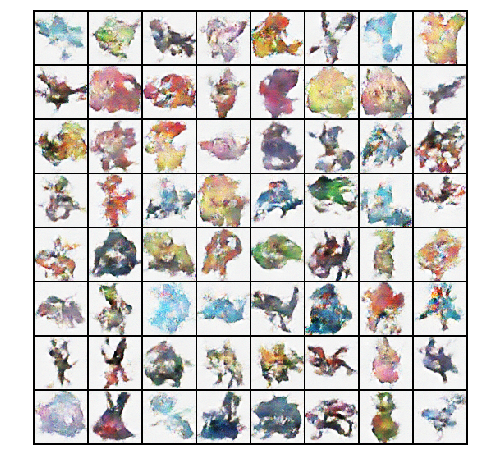

In [15]:
fig = plt.figure(figsize=(8, 8))
plt.axis('off')
imgs = [[plt.imshow(np.transpose(i, (1, 2, 0)), animated=True)] for i in img_list]
anim = animation.ArtistAnimation(fig, imgs, interval=1000, repeat_delay=1000, blit=True)

HTML(anim.to_jshtml())

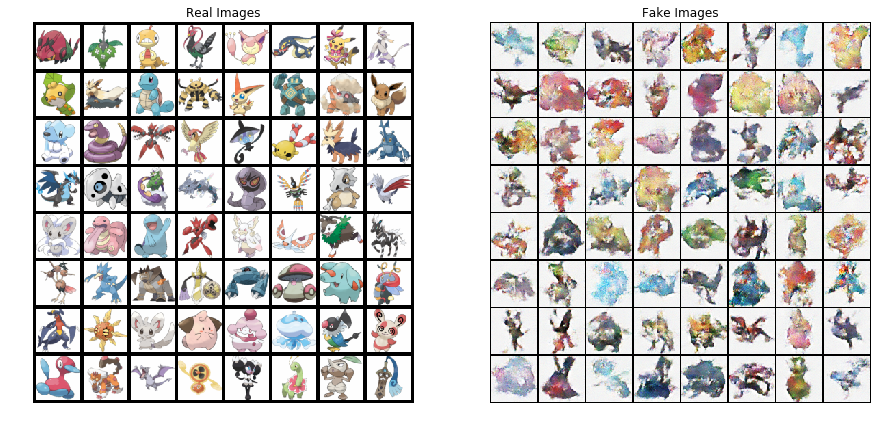

In [16]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()